# **Preparing Dependancies**

In [1]:
!pip install -q diffusers transformers accelerate safetensors torch torchvision


In [19]:
import torch
import gc
import numpy as np
import matplotlib.pyplot as plt

from diffusers import (
    StableDiffusionPipeline,
    StableDiffusionInpaintPipeline,
    StableDiffusionImg2ImgPipeline,
    EulerAncestralDiscreteScheduler,
    DPMSolverMultistepScheduler,
    DDIMScheduler
)
from PIL import Image, ImageDraw, ImageFilter

import torchvision.transforms as T
from torchvision.models.segmentation import deeplabv3_resnet50


In [3]:
device = "cuda" if torch.cuda.is_available() else "cpu"


# **Kriteria 1: Melakukan Image Generation dari Teks (Text-to-Image)**

## **Load Base Pipeline Model**

In [20]:
model_id = "runwayml/stable-diffusion-v1-5"

pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16
).to(device)

pipe.enable_attention_slicing()


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


In [21]:
prompt = "astronaut walking on mars surface, white EVA suit, Earth view from mars, reddish-brown desert ground scattered with small stones, deep black space background, starfield, blue marble Earth on horizon, space exploration scene, detailed illustration, smooth rendering, epic space vista, NASA mission style"
negative_prompt = (
    "photorealistic, realistic, photograph, 3d render, messy, blurry, "
    "low quality, bad art, ugly, sketch, grainy, unfinished, chromatic aberration"
)


## **Generate Image**

In [22]:
def generate_simple_image(prompt):
    image = pipe(prompt=prompt).images[0]
    return image


  0%|          | 0/50 [00:00<?, ?it/s]

(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

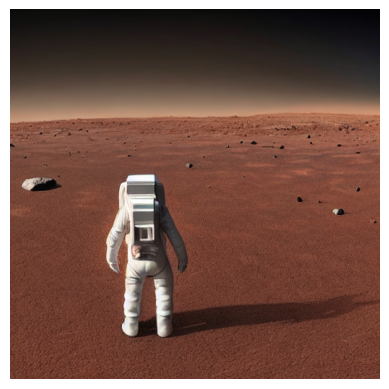

In [23]:
simple_image = generate_simple_image(prompt)
plt.imshow(simple_image)
plt.axis("off")


## **Generate Image with Hyperparameter Configuration**

In [24]:
def generate_advanced_image(
    prompt,
    negative_prompt,
    guidance_scale,
    num_inference_steps,
    seed
):
    generator = torch.Generator(device=device).manual_seed(seed)

    image = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
        generator=generator
    ).images[0]

    return image


  0%|          | 0/35 [00:00<?, ?it/s]

(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

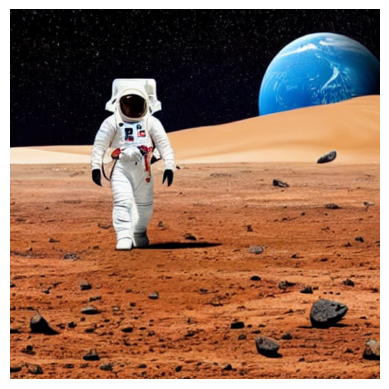

In [25]:
advanced_image = generate_advanced_image(
    prompt=prompt,
    negative_prompt=negative_prompt,
    guidance_scale=8.5,
    num_inference_steps=35,
    seed=222
)

plt.imshow(advanced_image)
plt.axis("off")


## **Guidance Scale Comparison**

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

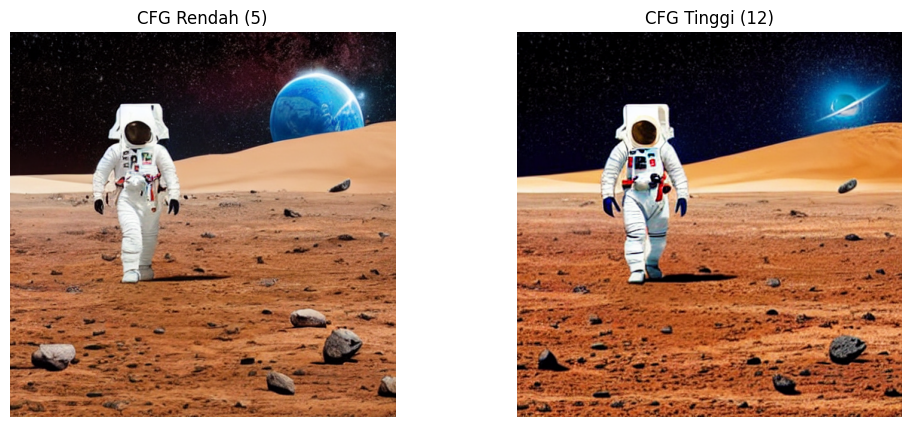

In [26]:
low_cfg = generate_advanced_image(
    prompt, negative_prompt, guidance_scale=5, num_inference_steps=35, seed=222
)

high_cfg = generate_advanced_image(
    prompt, negative_prompt, guidance_scale=12, num_inference_steps=35, seed=222
)

fig, axs = plt.subplots(1, 2, figsize=(12,5))
axs[0].imshow(low_cfg); axs[0].set_title("CFG Rendah (5)"); axs[0].axis("off")
axs[1].imshow(high_cfg); axs[1].set_title("CFG Tinggi (12)"); axs[1].axis("off")


### **Guidance Scale Explanation:**

*   **Gambar dengan "Scale" Rendah (CFG 5):**   
untuk hasil gambar dengan scale rendah hasilnya lebih bebas dan artistik dan warnanya lebih bervariasi terutama dibagian langit yang punya gradasi ungu kemerahan , dan detail spacesuit dan permukaan mars juga lebih halus dan soft, untuk scale ini model punya ruang untuk berkresi lebih kuas , jadi hasilnya lebih ekpresif tapi kadang agak nyelenehh dari prompt.Komposisinya terasa lebih natural, meski elemen utamanya (astronaut, Mars, Earth) tetap ada semua.

*   **Gambar dengan "Scale" Tinggi (CFG 12):**   
untuk hasil gambar dengan scale tinggi kalo diliat dari hasil kedua gambar bedanya cukup signifikan gambar jadi jauh lebih detail dan tajam. Tekstur spacesuit keliatan lipatannya, bebatuan Mars lebih jelas bentuknya, warnanya juga lebih standar (langit hitam, Mars oranye, Earth biru). Kontrasnya juga lebih kuat. untuk hasil Gambar ini hasilnya ngikutin prompt dengan sangat ketat, hasilnya lebih presisi. Kelemahannya kadang keliatan agak terlalu sempurna atau kaku dibanding yang CFG rendah.

## **Inference Steps Comparison**

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

(np.float64(-0.5), np.float64(511.5), np.float64(511.5), np.float64(-0.5))

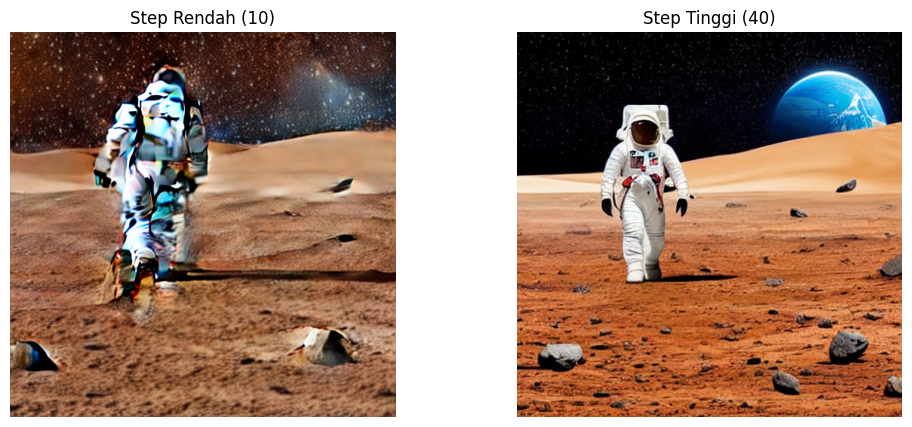

In [27]:
low_step = generate_advanced_image(
    prompt, negative_prompt, guidance_scale=8.5, num_inference_steps=10, seed=222
)

high_step = generate_advanced_image(
    prompt, negative_prompt, guidance_scale=8.5, num_inference_steps=40, seed=222
)

fig, axs = plt.subplots(1, 2, figsize=(12,5))
axs[0].imshow(low_step); axs[0].set_title("Step Rendah (10)"); axs[0].axis("off")
axs[1].imshow(high_step); axs[1].set_title("Step Tinggi (40)"); axs[1].axis("off")


### **Inference Step Explanation:**

*   **Gambar dengan "Step" Rendah (10):**  
untuk hasil gambar dengan step rendah hasilnya masih terlalu kasar dan belum selesai , kalo diliat dari gambar astronoutnya keliatan aneh dengan warna biru putih ga sesuai, bentuknya juga sama aneh distorsi banyak noise dan artefak yang muncul , langit langit banyak bintik ga karuan, tekstur permukaan mars juga masih kotor dan ga smooth, detail objek masih blur dan ga jelas, komposisis keseluruhan berantakan, kalo di liat dari hasil gambar ini masih setengah jadi yang belum sempurna yang butuh di poles lagi

*   **Gambar dengan "Step" Tinggi (40):**  
 untuk hasil gambar dengan step tinggi hasilnya kalo di bandingkan dengan gambar pertama jelas sangat berbeda, kalo yang ini jadi lebih bersih , tajam dan detail, astronautnya juga sekarang sudah jelas dengan spacesuit putih yang lebih proper di bandingkan gambar pertama, semua elemen udah pada tempatnya. Permukaan Mars halus dengan tekstur natural, bebatuan keliatan jelas, langit hitam pekat dengan bintang-bintang yang rapih, Earth-nya juga bagus. Nggak ada lagi noise atau artefak yang mengganggu. Proses denoising udah sangat bagus, hasilnya stabil.

## **Batch Inference from One Prompt**

In [28]:
generator = torch.Generator(device=device).manual_seed(222)

batch_images = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    guidance_scale=8.5,
    num_inference_steps=35,
    num_images_per_prompt=4,
    generator=generator
).images


  0%|          | 0/35 [00:00<?, ?it/s]

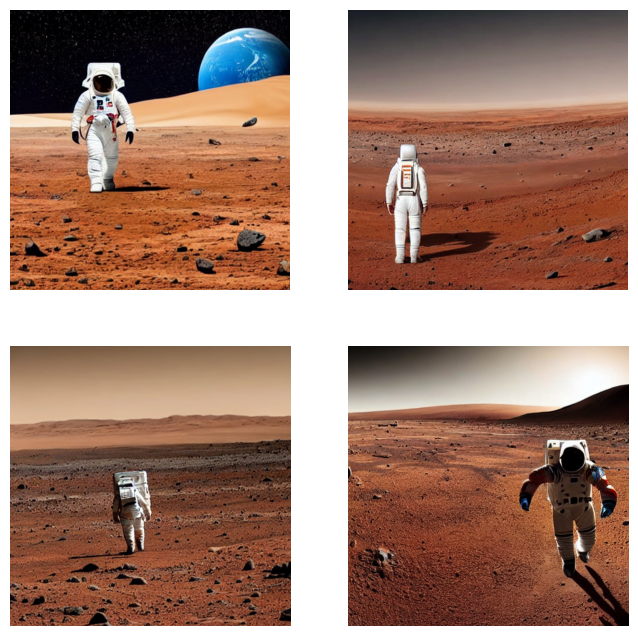

In [29]:
fig, axs = plt.subplots(2, 2, figsize=(8,8))
for i, ax in enumerate(axs.flatten()):
    ax.imshow(batch_images[i])
    ax.axis("off")


## **Load Scheduler**

In [30]:
def load_scheduler(pipe, scheduler_name):
    if scheduler_name == "Euler A":
        pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe.scheduler.config)
    elif scheduler_name == "DPM++":
        pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
    elif scheduler_name == "DDIM":
        pipe.scheduler = DDIMScheduler.from_config(pipe.scheduler.config)
    else:
        raise ValueError("Scheduler tidak didukung")
    return pipe


  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

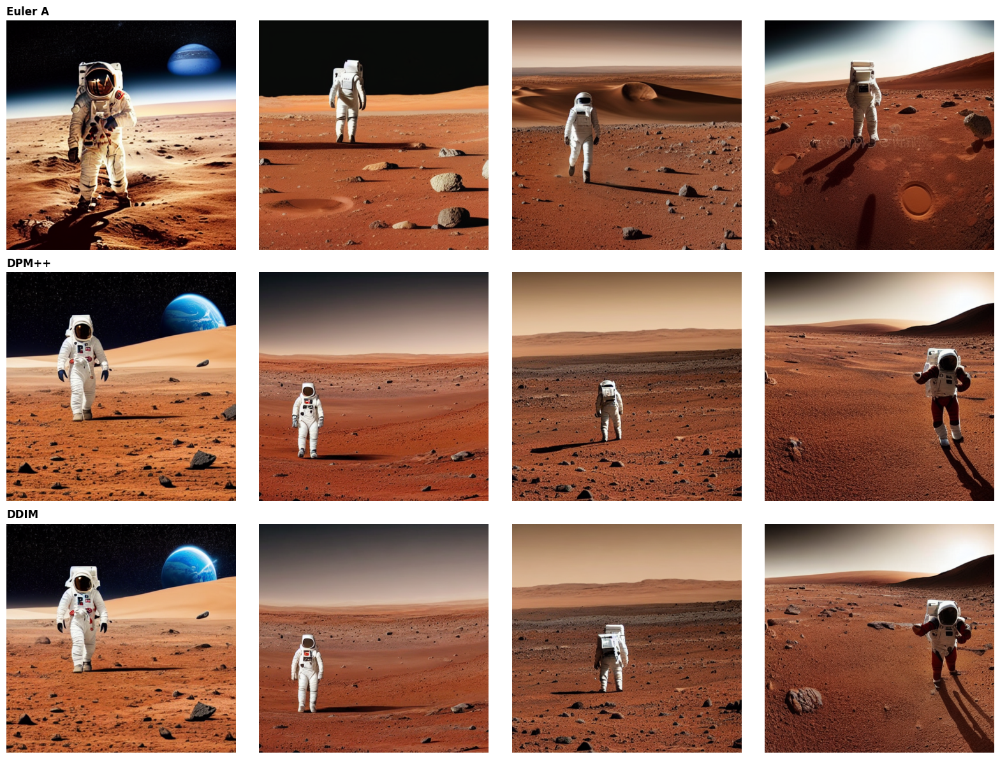

In [31]:
schedulers = ["Euler A", "DPM++", "DDIM"]
fig, axs = plt.subplots(3, 4, figsize=(16,12))

for row, sched in enumerate(schedulers):
    pipe = load_scheduler(pipe, sched)

    images = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        guidance_scale=8.5,
        num_inference_steps=35,
        num_images_per_prompt=4,
        generator=torch.Generator(device=device).manual_seed(222)
    ).images

    for col in range(4):
        axs[row, col].imshow(images[col])
        axs[row, col].axis("off")

    axs[row, 0].set_title(sched, loc="left", fontweight="bold")

plt.tight_layout()
plt.show()


### **Scheduler Comparation:**

*   **Gambar dengan "Euler A Scheduler":**  
untuk Hasilnya gambar dengan euler A paling bervariasi dan kreatif antar seed yang berbeda. Setiap gambar punya karakter unik ada yang astronautnya kelihatan vintage dengan warna kekuningan, ada yang lebih modern dan bersih. Komposisi dan angle-nya juga beda beda, dari close-up sampe wide shot. Warna langit dan atmosfer cukup dinamis, kadang gelap pekat kadang ada gradasi. Detail astronaut dan bebatuan cukup bagus, tapi konsistensinya kurang stabil tiap generate bisa beda banget hasilnya. Cocok kalau mau eksplorasi gaya visual yang beragam.

*   **Gambar dengan "DPM++ Scheduler":**  
Hasilnya lebih konsisten dan stabil dibanding Euler A. Kualitas visualnya smooth dan refined - langit punya gradasi yang halus dari gelap ke terang, permukaan Mars terlihat lebih natural dengan tekstur yang detail. Astronautnya selalu dalam proporsi yang bagus, pose-nya bervariasi tapi tetap realistis. Warnanya lebih balanced dan gak terlalu ekstrem

*   **Gambar dengan "DDIM Scheduler":**  
Mirip sama DPM++  konsisten, smooth, dan refined. Hampir gak ada perbedaan signifikan dari segi visual quality. Langit, permukaan Mars, dan astronautnya sama sama bagus dengan gradasi warna yang halus. Bedanya DDIM lebih deterministik, artinya dengan seed yang sama hasilnya akan identik.

In [16]:
# Hapus pipe lama untuk hemat VRAM
#del pipe
#gc.collect()
#torch.cuda.empty_cache()

# **Kriteria 2: Menyempurnakan Gambar Melalui Image-to-Image**

## **Base + Refiner Image Generation**

In [60]:

refiner_pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    model_id, # Menggunakan model_id yang sama ("runwayml/stable-diffusion-v1-5")
    torch_dtype=torch.float16
).to(device)

# 2. Fungsi Stage 1: Base Generation (Berhenti di 80%)
def generate_base_latents(prompt, negative_prompt, seed):
    generator = torch.Generator(device=device).manual_seed(seed)
    base_output = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        guidance_scale=8.5,
        num_inference_steps=40,
        denoising_end=0.8,      # Parameter kriteria Advanced
        output_type="latent",   # Output berupa latent tensor
        generator=generator
    ).images
    return base_output



Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


In [61]:
# 3. Fungsi Stage 2: Refiner (Melanjutkan dari 80%)
def refine_latents(prompt, negative_prompt, latents, seed):
    generator = torch.Generator(device=device).manual_seed(seed)
    refined_img = refiner_pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        image=latents,          # Mengambil latent dari Stage 1
        denoising_start=0.8,    # Parameter kriteria Advanced
        generator=generator
    ).images[0]
    return refined_img



  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

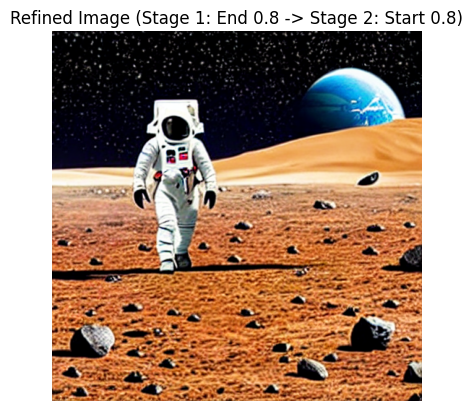

In [62]:
# --- EKSEKUSI ---
base_latents = generate_base_latents(prompt, negative_prompt, 222)
refined_image = refine_latents(prompt, negative_prompt, base_latents, 222)

# Tampilkan hasil
plt.imshow(refined_image)
plt.title("Refined Image (Stage 1: End 0.8 -> Stage 2: Start 0.8)")
plt.axis("off")
plt.show()

## **Inpainting**

### **Load Model Inpainting**

In [36]:
inpaint_model_id = "runwayml/stable-diffusion-inpainting"
inpaint_pipe = StableDiffusionInpaintPipeline.from_pretrained(
    inpaint_model_id,
    torch_dtype=torch.float16
).to(device)

model_index.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurre

### **Manual Masking**

In [37]:
def create_manual_mask(image_size):
    mask = Image.new("L", image_size, 0)
    draw = ImageDraw.Draw(mask)

    width, height = image_size

    # Koordinat mask (sedikit lebih lebar untuk memberi ruang bagi model)
    left   = width * 0.50
    top    = height * 0.40
    right  = width * 0.95
    bottom = height * 0.85

    # Pakai kotak agar area lebih luas
    draw.rectangle((left, top, right, bottom), fill=255)

    return mask


# Create manual mask dari hasil refiner
manual_mask = create_manual_mask(refined_image.size)


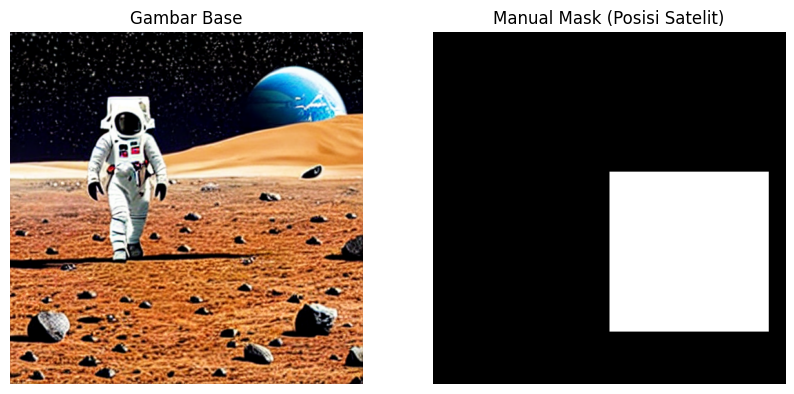

In [38]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(refined_image)
plt.title("Gambar Base")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(manual_mask, cmap="gray")
plt.title("Manual Mask (Posisi Satelit)")
plt.axis("off")

plt.show()


### **Generate**

In [49]:
# 2. Inpaint Engine dengan High Guidance
def inpaint_engine(image, mask, prompt, seed=9):
    generator = torch.Generator(device=device).manual_seed(seed)

    result = inpaint_pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        image=image,
        mask_image=mask,
        num_inference_steps=50,
        guidance_scale=9.5,
        strength=1.0,
        generator=generator
    ).images[0]

    return result


  0%|          | 0/50 [00:00<?, ?it/s]

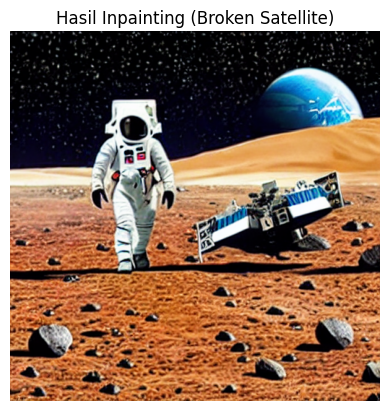

In [51]:
# Prompt yang dioptimasi untuk menghasilkan objek satelit emas yang hancur
inpaint_prompt = (
    "A damaged futuristic planetary lander, broken satellite debris, "
    "metallic gold and silver panels, exposed mechanical parts, "
    "multi-legged landing gear, crashed on Mars surface, "
    "highly detailed mechanical structure, sharp focus, "
    "realistic scale, photorealistic, cinematic lighting"
)

# Jalankan inpainting
# Pastikan inpaint_engine menggunakan strength=1.0 dan guidance_scale minimal 15.0

inpainted_image = inpaint_engine(
    refined_image,
    manual_mask,
    inpaint_prompt,
    seed=9
)

plt.imshow(inpainted_image)
plt.title("Hasil Inpainting (Broken Satellite)")
plt.axis("off")
plt.show()


## **Inpainting Menggunakan Automasking**

### **load Model Segmentation Untuk Masking**

In [52]:
segmentation_model = deeplabv3_resnet50(pretrained=True).eval().to(device)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


### **Masking with Segmentation Model**

In [53]:
def get_auto_mask(image):
    # Preprocessing standar untuk model Vision Torchvision
    preprocess = T.Compose([
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    input_tensor = preprocess(image).unsqueeze(0).to(device)

    with torch.no_grad():
        # Mendapatkan output segmentasi
        output = segmentation_model(input_tensor)['out'][0]

    # Ambil prediksi kelas dengan probabilitas tertinggi
    output_predictions = output.argmax(0).byte().cpu().numpy()

    # Indeks 15 adalah 'person' dalam dataset Pascal VOC (tempat DeepLabV3 dilatih)
    # Kita buat mask putih (255) untuk person, dan hitam (0) untuk sisanya
    mask_np = (output_predictions == 15).astype(np.uint8) * 255

    # Konversi kembali ke PIL Image dan resize agar sesuai gambar asli
    auto_mask_img = Image.fromarray(mask_np).resize(image.size)

    return auto_mask_img

# Eksekusi automasking
auto_mask = get_auto_mask(inpainted_image)



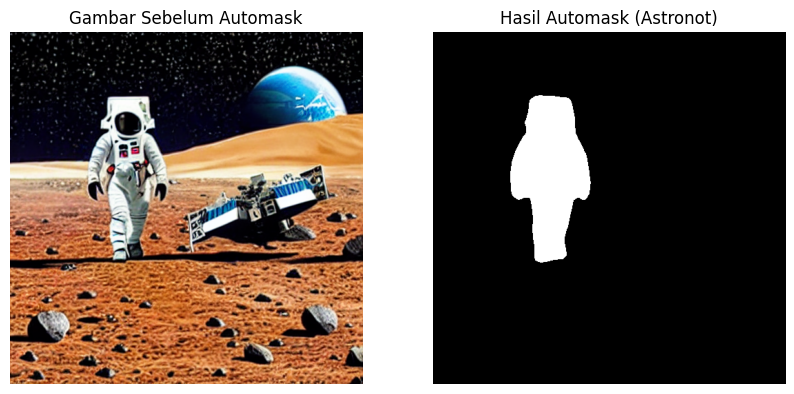

In [54]:
# Visualisasi Automask
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(inpainted_image)
plt.title("Gambar Sebelum Automask")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(auto_mask, cmap="gray")
plt.title("Hasil Automask (Astronot)")
plt.axis("off")
plt.show()

### **Generate**

  0%|          | 0/50 [00:00<?, ?it/s]

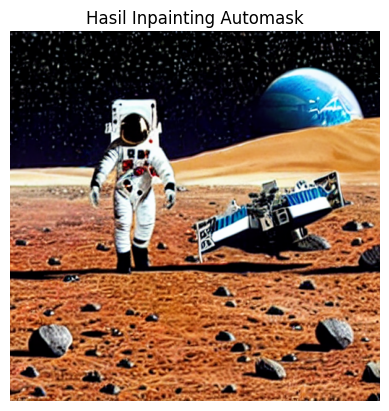

In [55]:
auto_inpaint_prompt = (
    "an astronaut wearing a futuristic golden space suit, "
    "highly detailed, sci-fi, cinematic lighting"
)

auto_inpainted_image = inpaint_engine(
    inpainted_image,
    auto_mask,
    auto_inpaint_prompt,
    seed=9
)

plt.imshow(auto_inpainted_image)
plt.title("Hasil Inpainting Automask")
plt.axis("off")
plt.show()


## **Outpainting**

### **Prepare the Canvas**

In [56]:
def prepare_outpainting(image, direction="right"):
    w, h = image.size

    if direction == "right":
        # Tambah lebar 256 pixel ke kanan
        new_width = w + 256
        new_image = Image.new("RGB", (new_width, h))
        new_image.paste(image, (0, 0))

        # Buat mask: Hitam (0) untuk bagian gambar lama, Putih (255) untuk area baru
        mask = Image.new("L", (new_width, h), 255)
        mask.paste(Image.new("L", (w, h), 0), (0, 0))

    return new_image, mask

canvas_image, canvas_mask = prepare_outpainting(auto_inpainted_image, "right")

### **Generate**

  0%|          | 0/50 [00:00<?, ?it/s]

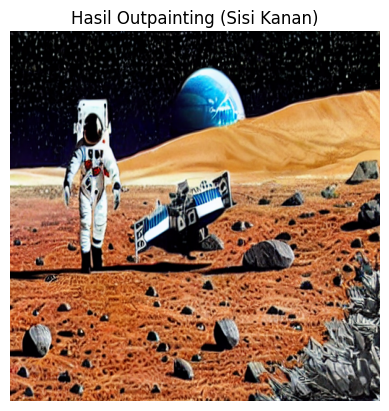

In [57]:
outpaint_prompt = "extended mars landscape, rocky desert, crater, starry sky, cinematic"

outpainted_result = inpaint_pipe(
    prompt=outpaint_prompt,
    image=canvas_image,
    mask_image=canvas_mask,
    strength=1.0, # Wajib 1.0 untuk outpainting area kosong
    generator=torch.Generator(device=device).manual_seed(9)
).images[0]

plt.imshow(outpainted_result)
plt.title("Hasil Outpainting (Sisi Kanan)")
plt.axis("off")
plt.show()

## **Outpainting Zoom Out**

### **Prepare Canvas for Zoom Out**

In [58]:
def prepare_zoom_out(image, padding=128):
    w, h = image.size
    new_w, new_h = w + padding*2, h + padding*2

    # Buat canvas besar dan taruh gambar asli di tengah
    zoom_canvas = Image.new("RGB", (new_w, new_h))
    zoom_canvas.paste(image, (padding, padding))

    # Buat mask putih di pinggir, hitam di tengah (area gambar asli)
    zoom_mask = Image.new("L", (new_w, new_h), 255)
    zoom_mask.paste(Image.new("L", (w, h), 0), (padding, padding))

    return zoom_canvas, zoom_mask

zoom_canvas, zoom_mask = prepare_zoom_out(outpainted_result, padding=128)

### **Generate**

  0%|          | 0/50 [00:00<?, ?it/s]

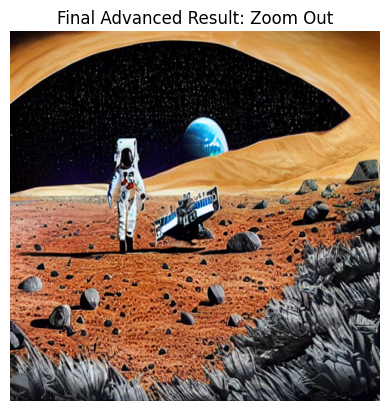

In [59]:
final_zoom_image = inpaint_pipe(
    prompt=prompt, # Gunakan prompt awal astronot di mars agar konsisten
    image=zoom_canvas,
    mask_image=zoom_mask,
    strength=1.0,
    generator=torch.Generator(device=device).manual_seed(9)
).images[0]

plt.imshow(final_zoom_image)
plt.title("Final Advanced Result: Zoom Out")
plt.axis("off")
plt.show()